# Imports

In [7]:
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
import csv
import matplotlib.pyplot as plt

## Imports from sklearn

In [8]:
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.linear_model import Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import learning_curve
from sklearn.model_selection import train_test_split
from sklearn.linear_model import RidgeCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split

In [10]:
# autoreload
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Import: This stops the annoying future warning messages

In [11]:
import warnings
warnings.filterwarnings('ignore')

# Basic EDA

## Basic info on dataset: shape, info, head, tail, describe, nunique

In [14]:
nasa = pd.read_csv('../data/nasa.csv')
nasa.shape

(6047, 40)

In [31]:
nasa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6047 entries, 0 to 6046
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Neo Reference ID              6047 non-null   int64  
 1   Name                          6047 non-null   int64  
 2   Absolute Magnitude            6047 non-null   float64
 3   Est Dia in KM(min)            6047 non-null   float64
 4   Est Dia in KM(max)            6047 non-null   float64
 5   Est Dia in M(min)             6047 non-null   float64
 6   Est Dia in M(max)             6047 non-null   float64
 7   Est Dia in Miles(min)         6047 non-null   float64
 8   Est Dia in Miles(max)         6047 non-null   float64
 9   Est Dia in Feet(min)          6047 non-null   float64
 10  Est Dia in Feet(max)          6047 non-null   float64
 11  Epoch Date Close Approach     6047 non-null   float64
 12  Relative Velocity km per sec  6047 non-null   float64
 13  Rel

In [17]:
nasa.head()

,Neo Reference ID,Name,Absolute Magnitude,Est Dia in KM(min),Est Dia in KM(max),Est Dia in M(min),Est Dia in M(max),Est Dia in Miles(min),Est Dia in Miles(max),Est Dia in Feet(min),...,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Close Approach Date,Orbit Determination Date,Orbiting Body,Equinox,Hazardous
0,3723955,3723955,21.3,0.146068,0.326618,146.067964,326.617897,0.090762,0.202951,479.225620,...,313.091975,1.497352,2457794.969,173.741112,0.845330,01/01/1995,06/04/2017 08:32,1,1,0
1,3092506,3092506,27.4,0.008801,0.019681,8.801465,19.680675,0.005469,0.012229,28.876199,...,18.707701,1.527904,2457902.337,68.741007,0.700277,15/01/1995,06/04/2017 09:15,1,1,0
2,3671135,3671135,19.6,0.319562,0.714562,319.561887,714.562102,0.198566,0.444008,1048.431420,...,198.145969,2.069265,2458009.403,354.237368,0.647295,15/01/1995,04/06/2017 06:16,1,1,0
3,2495323,2495323,19.6,0.319562,0.714562,319.561887,714.562102,0.198566,0.444008,1048.431420,...,198.145960,2.069265,2458009.403,354.237396,0.647295,15/01/1995,28/06/2017 06:19,1,1,0
4,2153315,2153315,19.2,0.384198,0.859093,384.197891,859.092601,0.238729,0.533815,1260.491809,...,288.374651,1.794045,2458242.439,186.776932,0.715978,22/01/1995,06/04/2017 09:27,1,1,0


In [18]:
nasa.tail()

,Neo Reference ID,Name,Absolute Magnitude,Est Dia in KM(min),Est Dia in KM(max),Est Dia in M(min),Est Dia in M(max),Est Dia in Miles(min),Est Dia in Miles(max),Est Dia in Feet(min),...,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Close Approach Date,Orbit Determination Date,Orbiting Body,Equinox,Hazardous
6042,3744785,3744785,19.3,0.366906,0.820427,366.906137,820.427065,0.227985,0.509790,1203.760332,...,100.270236,2.594602,2458331.448,205.762131,0.466049,08/08/2016,06/04/2017 08:28,1,1,1
6043,3755345,3755345,21.5,0.133216,0.297879,133.215567,297.879063,0.082776,0.185093,437.058960,...,39.290250,1.136024,2457847.971,142.264753,0.932706,08/08/2016,22/07/2017 06:20,1,1,1
6044,2333578,2333578,20.2,0.242412,0.542051,242.412481,542.050786,0.150628,0.336815,795.316565,...,196.948416,2.166770,2457645.295,177.326777,0.499223,15/08/2016,06/04/2017 09:23,1,1,1
6045,3475236,3475236,21.6,0.127220,0.284472,127.219878,284.472297,0.079051,0.176763,417.388066,...,256.055109,2.249136,2458240.346,223.131665,0.570652,15/08/2016,06/04/2017 08:59,1,1,1
6046,2068346,2068346,16.9,1.108039,2.477650,1108.038821,2477.650126,0.688503,1.539540,3635.298086,...,140.245404,2.135575,2458321.178,189.232032,0.532522,08/09/2016,06/04/2017 09:28,1,1,1


In [19]:
nasa.describe

<bound method NDFrame.describe of       Neo Reference ID     Name  Absolute Magnitude  Est Dia in KM(min)  \
0              3723955  3723955                21.3            0.146068   
1              3092506  3092506                27.4            0.008801   
2              3671135  3671135                19.6            0.319562   
3              2495323  2495323                19.6            0.319562   
4              2153315  2153315                19.2            0.384198   
...                ...      ...                 ...                 ...   
6042           3744785  3744785                19.3            0.366906   
6043           3755345  3755345                21.5            0.133216   
6044           2333578  2333578                20.2            0.242412   
6045           3475236  3475236                21.6            0.127220   
6046           2068346  2068346                16.9            1.108039   

      Est Dia in KM(max)  Est Dia in M(min)  Est Dia in M(max)  \

In [20]:
nasa.describe().T

,count,mean,std,min,25%,50%,75%,max
Neo Reference ID,6047.0,3.153566e+06,6.074209e+05,2.001566e+06,2.450894e+06,3.434370e+06,3.655869e+06,3.781897e+06
Name,6047.0,3.153566e+06,6.074209e+05,2.001566e+06,2.450894e+06,3.434370e+06,3.655869e+06,3.781897e+06
Absolute Magnitude,6047.0,2.144589e+01,2.625812e+00,1.392000e+01,1.970000e+01,2.100000e+01,2.280000e+01,3.210000e+01
Est Dia in KM(min),6047.0,2.441860e-01,2.945553e-01,1.010543e-03,7.320740e-02,1.677085e-01,3.051792e-01,4.370740e+00
Est Dia in KM(max),6047.0,5.460164e-01,6.586457e-01,2.259644e-03,1.636967e-01,3.750075e-01,6.824015e-01,9.773272e+00
Est Dia in M(min),6047.0,2.441860e+02,2.945553e+02,1.010543e+00,7.320740e+01,1.677085e+02,3.051792e+02,4.370740e+03
Est Dia in M(max),6047.0,5.460164e+02,6.586457e+02,2.259644e+00,1.636967e+02,3.750075e+02,6.824015e+02,9.773272e+03
Est Dia in Miles(min),6047.0,1.517301e-01,1.830281e-01,6.279220e-04,4.548895e-02,1.042092e-01,1.896295e-01,2.715851e+00
Est Dia in Miles(max),6047.0,3.392788e-01,4.092634e-01,1.404077e-03,1.017164e-01,2.330188e-01,4.240245e-01,6.072828e+00
Est Dia in Feet(min),6047.0,8.011350e+02,9.663889e+02,3.315431e+00,2.401818e+02,5.502246e+02,1.001244e+03,1.433970e+04


In [21]:
nasa.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Neo Reference ID,6047.0,NaN,NaN,NaN,3153566.365636,607420.922186,2001566.0,2450894.0,3434370.0,3655869.0,3781897.0
Name,6047.0,NaN,NaN,NaN,3153566.365636,607420.922186,2001566.0,2450894.0,3434370.0,3655869.0,3781897.0
Absolute Magnitude,6047.0,NaN,NaN,NaN,21.445894,2.625812,13.92,19.7,21.0,22.8,32.1
Est Dia in KM(min),6047.0,NaN,NaN,NaN,0.244186,0.294555,0.001011,0.073207,0.167708,0.305179,4.37074
Est Dia in KM(max),6047.0,NaN,NaN,NaN,0.546016,0.658646,0.00226,0.163697,0.375008,0.682402,9.773272
Est Dia in M(min),6047.0,NaN,NaN,NaN,244.185954,294.555332,1.010543,73.207399,167.708462,305.179233,4370.74004
Est Dia in M(max),6047.0,NaN,NaN,NaN,546.016392,658.645745,2.259644,163.69672,375.007522,682.401509,9773.271842
Est Dia in Miles(min),6047.0,NaN,NaN,NaN,0.15173,0.183028,0.000628,0.045489,0.104209,0.18963,2.715851
Est Dia in Miles(max),6047.0,NaN,NaN,NaN,0.339279,0.409263,0.001404,0.101716,0.233019,0.424025,6.072828
Est Dia in Feet(min),6047.0,NaN,NaN,NaN,801.135044,966.388915,3.315431,240.181763,550.224631,1001.244233,14339.69875


In [23]:
nasa.nunique()

Neo Reference ID                3104
Name                            3104
Absolute Magnitude               248
Est Dia in KM(min)               248
Est Dia in KM(max)               248
Est Dia in M(min)                248
Est Dia in M(max)                248
Est Dia in Miles(min)            248
Est Dia in Miles(max)            248
Est Dia in Feet(min)             248
Est Dia in Feet(max)             248
Epoch Date Close Approach        223
Relative Velocity km per sec    3785
Relative Velocity km per hr     3785
Miles per hour                  3784
Miss Dist.(Astronomical)        3768
Miss Dist.(lunar)               3764
Miss Dist.(kilometers)          3765
Miss Dist.(miles)               3764
Orbit ID                         171
Orbit Uncertainity                10
Minimum Orbit Intersection      3091
Jupiter Tisserand Invariant     2233
Epoch Osculation                 370
Eccentricity                    3098
Semi Major Axis                 3097
Inclination                     3098
A

### isnull to find missing records in each column

In [24]:
nasa.isnull().sum()

Neo Reference ID                0
Name                            0
Absolute Magnitude              0
Est Dia in KM(min)              0
Est Dia in KM(max)              0
Est Dia in M(min)               0
Est Dia in M(max)               0
Est Dia in Miles(min)           0
Est Dia in Miles(max)           0
Est Dia in Feet(min)            0
Est Dia in Feet(max)            0
Epoch Date Close Approach       0
Relative Velocity km per sec    0
Relative Velocity km per hr     0
Miles per hour                  0
Miss Dist.(Astronomical)        0
Miss Dist.(lunar)               0
Miss Dist.(kilometers)          0
Miss Dist.(miles)               0
Orbit ID                        0
Orbit Uncertainity              0
Minimum Orbit Intersection      0
Jupiter Tisserand Invariant     0
Epoch Osculation                0
Eccentricity                    0
Semi Major Axis                 0
Inclination                     0
Asc Node Longitude              0
Orbital Period                  0
Perihelion Dis

### Percent of missing values in each column

In [26]:
(nasa.isnull().sum()/(len(nasa)))*100

Neo Reference ID                0.0
Name                            0.0
Absolute Magnitude              0.0
Est Dia in KM(min)              0.0
Est Dia in KM(max)              0.0
Est Dia in M(min)               0.0
Est Dia in M(max)               0.0
Est Dia in Miles(min)           0.0
Est Dia in Miles(max)           0.0
Est Dia in Feet(min)            0.0
Est Dia in Feet(max)            0.0
Epoch Date Close Approach       0.0
Relative Velocity km per sec    0.0
Relative Velocity km per hr     0.0
Miles per hour                  0.0
Miss Dist.(Astronomical)        0.0
Miss Dist.(lunar)               0.0
Miss Dist.(kilometers)          0.0
Miss Dist.(miles)               0.0
Orbit ID                        0.0
Orbit Uncertainity              0.0
Minimum Orbit Intersection      0.0
Jupiter Tisserand Invariant     0.0
Epoch Osculation                0.0
Eccentricity                    0.0
Semi Major Axis                 0.0
Inclination                     0.0
Asc Node Longitude          

### Separates Numerical and Categorical variables

In [28]:
cat_cols=nasa.select_dtypes(include=['object']).columns
num_cols = nasa.select_dtypes(include=np.number).columns.tolist()
print("Categorical Variables:")
print(cat_cols)
print("Numerical Variables:")
print(num_cols)

Categorical Variables:
Index(['Close Approach Date', 'Orbit Determination Date'], dtype='object')
Numerical Variables:
['Neo Reference ID', 'Name', 'Absolute Magnitude', 'Est Dia in KM(min)', 'Est Dia in KM(max)', 'Est Dia in M(min)', 'Est Dia in M(max)', 'Est Dia in Miles(min)', 'Est Dia in Miles(max)', 'Est Dia in Feet(min)', 'Est Dia in Feet(max)', 'Epoch Date Close Approach', 'Relative Velocity km per sec', 'Relative Velocity km per hr', 'Miles per hour', 'Miss Dist.(Astronomical)', 'Miss Dist.(lunar)', 'Miss Dist.(kilometers)', 'Miss Dist.(miles)', 'Orbit ID', 'Orbit Uncertainity', 'Minimum Orbit Intersection', 'Jupiter Tisserand Invariant', 'Epoch Osculation', 'Eccentricity', 'Semi Major Axis', 'Inclination', 'Asc Node Longitude', 'Orbital Period', 'Perihelion Distance', 'Perihelion Arg', 'Aphelion Dist', 'Perihelion Time', 'Mean Anomaly', 'Mean Motion', 'Orbiting Body', 'Equinox', 'Hazardous']


# Quick Graphs

## Correlation Matrix Raw

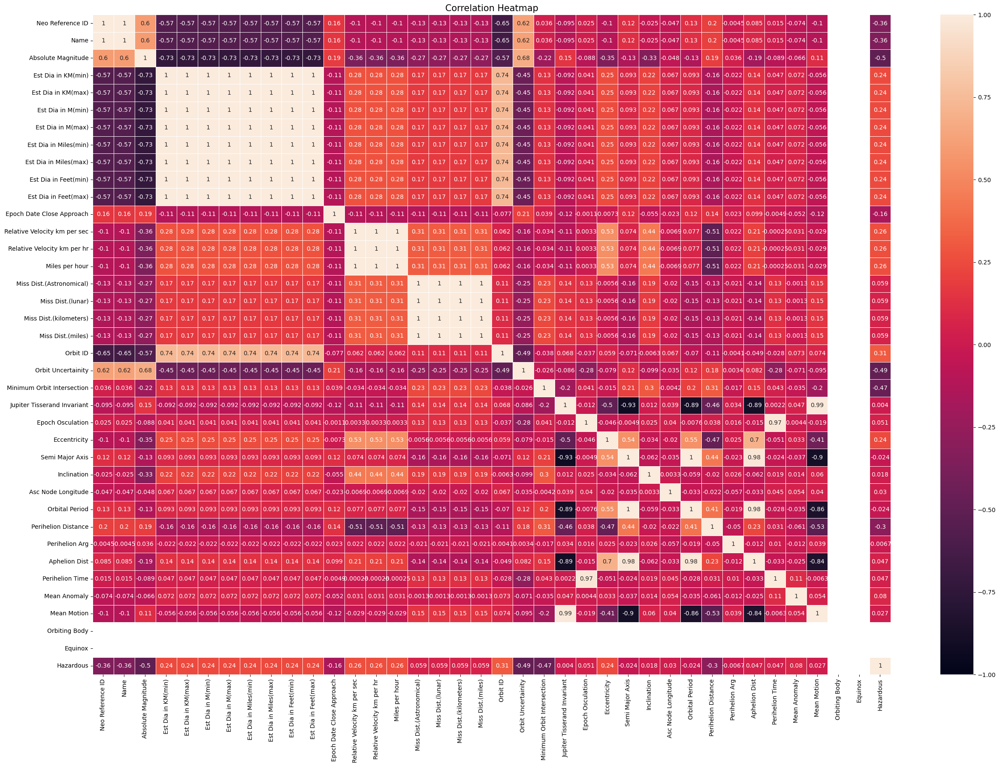

In [29]:
plt.figure(figsize = (30, 20))
sns.heatmap((nasa).corr(), annot = True, linewidths=.5, vmin = -1, vmax = 1)
plt.title('Correlation Heatmap', fontsize = 15)
plt.show()

## SNS pairplot

In [30]:
# created a pair plot to identify relationships between variables
sns.pairplot(data=nasa, corner=True)